In [1]:
import os
import sys
custom_paths = ['../src/', '../cifar-10.1-pytorch/', '../data-copying/', '../PyTorch_CIFAR10/']
for path in custom_paths:
    if os.path.abspath(path) not in sys.path:
        sys.path.insert(0, os.path.abspath(path))
        print(f"Added {os.path.abspath(path)} to path")

Added /work/cybai2020/PyTorch-StudioGAN/src to path
Added /work/cybai2020/PyTorch-StudioGAN/cifar-10.1-pytorch to path
Added /work/cybai2020/PyTorch-StudioGAN/data-copying to path
Added /work/cybai2020/PyTorch-StudioGAN/PyTorch_CIFAR10 to path


In [37]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import functools
from importlib import reload
from matplotlib import pyplot as plt
import scipy
from scipy import stats
from scipy.special import softmax
import os
import ast
import glob

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans 

import torch
from torch.nn import Parameter as P
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

import cifar10_models
reload(cifar10_models)

import cifar10_1
reload(cifar10_1)

from data_utils.load_dataset import LoadDataset

from data_utils import cifair
reload(cifair)

from metrics.feat_extract_models import alexnet, inception, vgg
reload(alexnet)
reload(inception)
reload(vgg)

from utils import load_checkpoint
reload(load_checkpoint)

from metrics.FID import calculate_frechet_distance

import misc
reload(misc)

import data_copying_tests
reload(data_copying_tests)

<module 'data_copying_tests' from '/work/cybai2020/PyTorch-StudioGAN/data-copying/data_copying_tests.py'>

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = 'cuda'
torch.backends.cudnn.benchmark = True

In [4]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(0.5, 0.5)])

celebahq_64_train_dset = datasets.ImageFolder('../data/CELEBA-HQ_64/train', transform=transform)
celebahq_64_test_dset = datasets.ImageFolder('../data/CELEBA-HQ_64/valid', transform=transform)

celebahq_128_train_dset = datasets.ImageFolder('../data/CELEBA-HQ_128/train', transform=transform)
celebahq_128_test_dset = datasets.ImageFolder('../data/CELEBA-HQ_128/valid', transform=transform)

In [5]:
celebahq_64_dls = {k: DataLoader(v, batch_size=50, shuffle=False, num_workers=8, drop_last=False)
                   for k, v in {'train': celebahq_64_train_dset, 'test': celebahq_64_test_dset}.items()}
celebahq_128_dls = {k: DataLoader(v, batch_size=50, shuffle=False, num_workers=8, drop_last=False)
                    for k, v in {'train': celebahq_128_train_dset, 'test': celebahq_128_test_dset}.items()}

In [6]:
proj_model = inception.WrappedInception3().eval().to(device)

##### trainable parameters

#####


In [38]:
celebahq_64_feats = {}
for dset_name, dl in celebahq_64_dls.items():
    print(dset_name)
    _, feats_, logits_ = misc.project(dl, proj_model, n_samples=None, to_numpy=True)
    # top_1_conf = np.amax(softmax(logits_, axis=-1), axis=-1)
    celebahq_64_feats[dset_name] = feats_
    
celebahq_128_feats = {}
for dset_name, dl in celebahq_128_dls.items():
    print(dset_name)
    _, feats_, logits_ = misc.project(dl, proj_model, n_samples=None, to_numpy=True)
    # top_1_conf = np.amax(softmax(logits_, axis=-1), axis=-1)
    celebahq_128_feats[dset_name] = feats_

train
test
train
test


In [25]:
nnds, _ = misc.calculate_knnd_numpy(target_feats=celebahq_64_feats['test'], 
                                    ref_feats=celebahq_64_feats['train'])
nnds.shape

(5817,)

(array([ 11.,   1.,   2.,   5.,  11.,  44., 141., 267., 420., 473., 460.,
        541., 549., 472., 397., 368., 331., 258., 210., 178., 145., 127.,
        110.,  72.,  60.,  44.,  34.,  23.,  18.,  17.,  11.,   2.,   2.,
          6.,   3.,   0.,   1.,   0.,   1.,   1.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   1.]),
 array([5.96046448e-08, 6.96185371e-03, 1.39236478e-02, 2.08854415e-02,
        2.78472360e-02, 3.48090306e-02, 4.17708233e-02, 4.87326160e-02,
        5.56944124e-02, 6.26562014e-02, 6.96180016e-02, 7.65797943e-02,
        8.35415870e-02, 9.05033797e-02, 9.74651724e-02, 1.04426965e-01,
        1.11388765e-01, 1.18350558e-01, 1.25312343e-01, 1.32274151e-01,
        1.39235944e-01, 1.46197736e-01, 1.53159529e-01, 1.60121322e-01,
        1.67083114e-01, 1.74044907e-01, 1.81006700e-01, 1.87968493e-01,
        1.94930285e-01, 2.01892078e-01, 2.08853871e-01, 2.15815663e-01,
        2.22777471e-01, 2.29739264e-01, 2.36701056e-01, 2.43662849e-01,
        2.

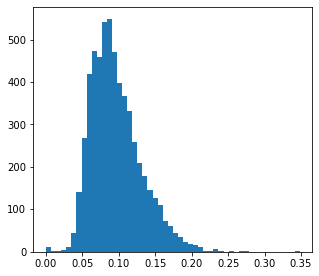

In [27]:
plt.figure(figsize=(5, 4.5))
plt.hist(nnds, bins=50)

In [28]:
nnds, _ = misc.calculate_knnd_numpy(target_feats=celebahq_128_feats['test'], 
                                    ref_feats=celebahq_128_feats['train'])
nnds.shape

(5817,)

(array([ 11.,   2.,   2.,   3.,  13.,  60., 164., 290., 430., 535., 524.,
        530., 512., 473., 416., 366., 318., 247., 209., 173., 157., 104.,
         78.,  66.,  44.,  36.,  12.,  16.,   9.,   4.,   5.,   3.,   1.,
          1.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   1.]),
 array([-2.3841858e-07,  8.3148666e-03,  1.6629972e-02,  2.4945078e-02,
         3.3260182e-02,  4.1575290e-02,  4.9890395e-02,  5.8205500e-02,
         6.6520602e-02,  7.4835710e-02,  8.3150819e-02,  9.1465920e-02,
         9.9781029e-02,  1.0809613e-01,  1.1641124e-01,  1.2472634e-01,
         1.3304144e-01,  1.4135656e-01,  1.4967166e-01,  1.5798676e-01,
         1.6630188e-01,  1.7461698e-01,  1.8293208e-01,  1.9124718e-01,
         1.9956230e-01,  2.0787740e-01,  2.1619250e-01,  2.2450761e-01,
         2.3282272e-01,  2.4113782e-01,  2.4945292e-01,  2.5776803e-01,
         2.6608312e-01,  2.7439824e-01,  2.8271335e-01,  2.9102844e-01,
         2

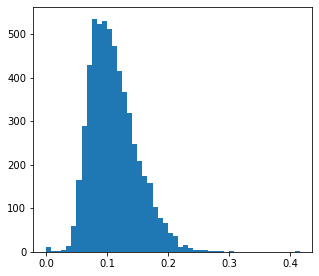

In [29]:
plt.figure(figsize=(5, 4.5))
plt.hist(nnds, bins=50)

In [8]:
def wrapper(runname, dset):
    if len(glob.glob(f'../checkpoints/{runname}/model=G_ema-best-weights-step=*.pth')) > 0:
        ema_g_path = glob.glob(f'../checkpoints/{runname}/model=G_ema-best-weights-step=*.pth')[0]
    else:
        ema_g_path = glob.glob(f'../checkpoints/{runname}/model=G-best-weights-step=*.pth')[0]
    config_path = f"../src/configs/{dset}/{runname.split('-')[0]}.json"
    sampler = misc.construct_sampler(ema_g_path, config_path, device)
    return sampler

In [9]:
biggan_128_accu1_sampler = wrapper('BigGAN-train-2021_04_24_10_27_56', 'CELEBA-HQ_128')
biggan_128_accu2_sampler = wrapper('BigGAN-train-2021_04_24_10_16_15', 'CELEBA-HQ_128')

In [10]:
# biggan_64_128_1_sampler = wrapper('BigGAN-train-2021_04_24_11_29_05', 'CELEBA-HQ_64')
biggan_64_256_1_sampler = wrapper('BigGAN-train-2021_04_25_01_11_21', 'CELEBA-HQ_64')
biggan_64_512_2_sampler = wrapper('BigGAN-train-2021_04_24_11_34_51', 'CELEBA-HQ_64')

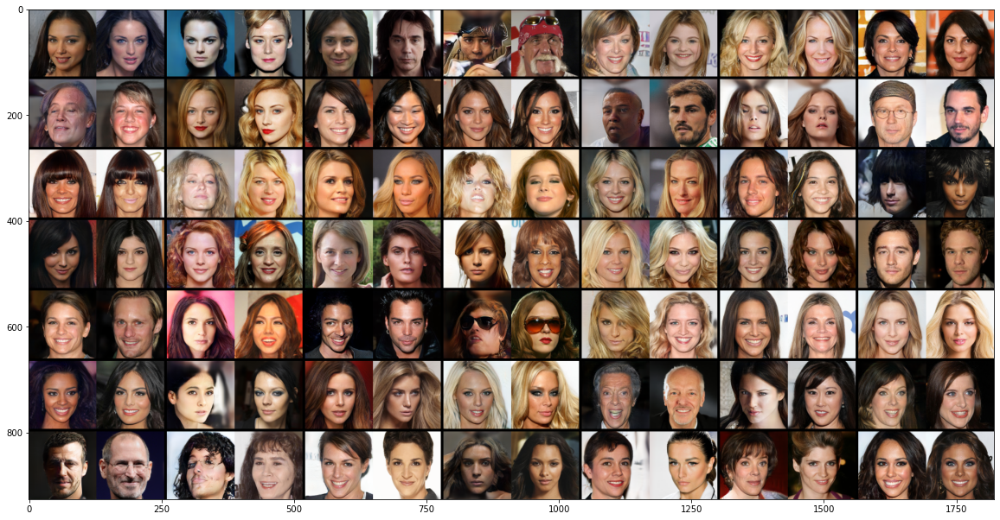

In [48]:
nnds = visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['train'], proj_model)

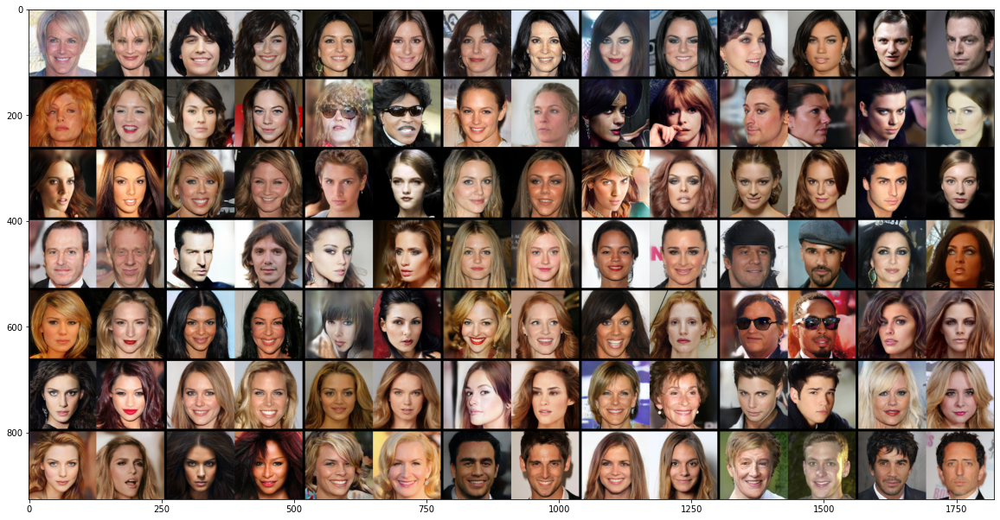

In [49]:
nnds = visualize_1nns(biggan_128_accu1_sampler, celebahq_128_dls['test'], proj_model)

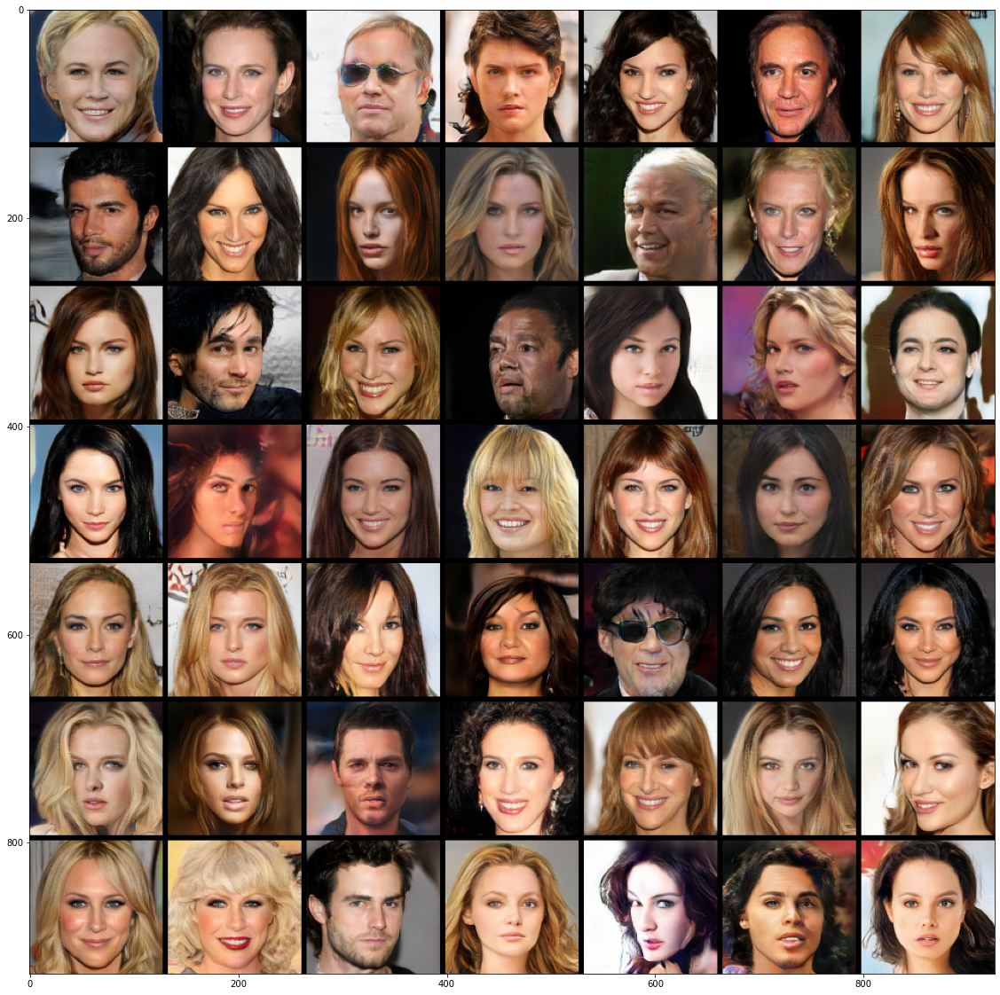

In [13]:
visualize_samples(biggan_128_accu2_sampler)

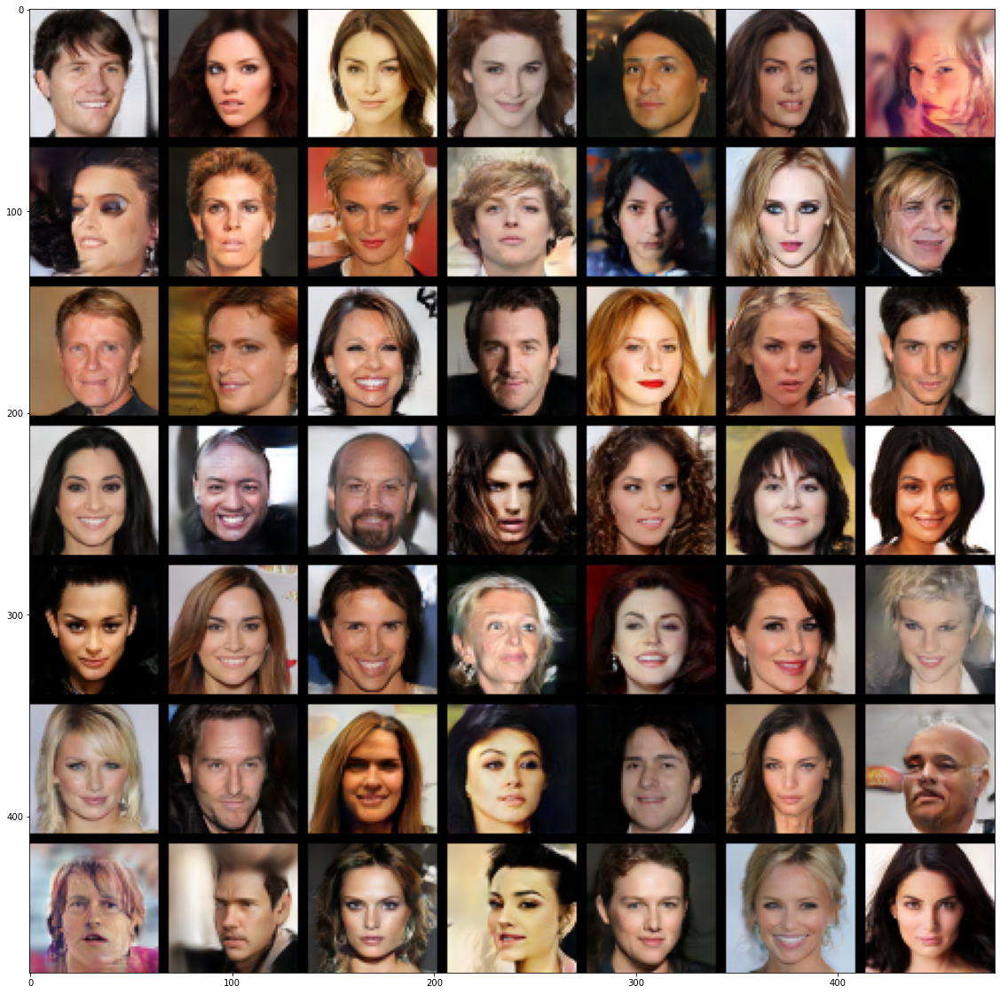

In [15]:
visualize_samples(biggan_64_256_1_sampler)

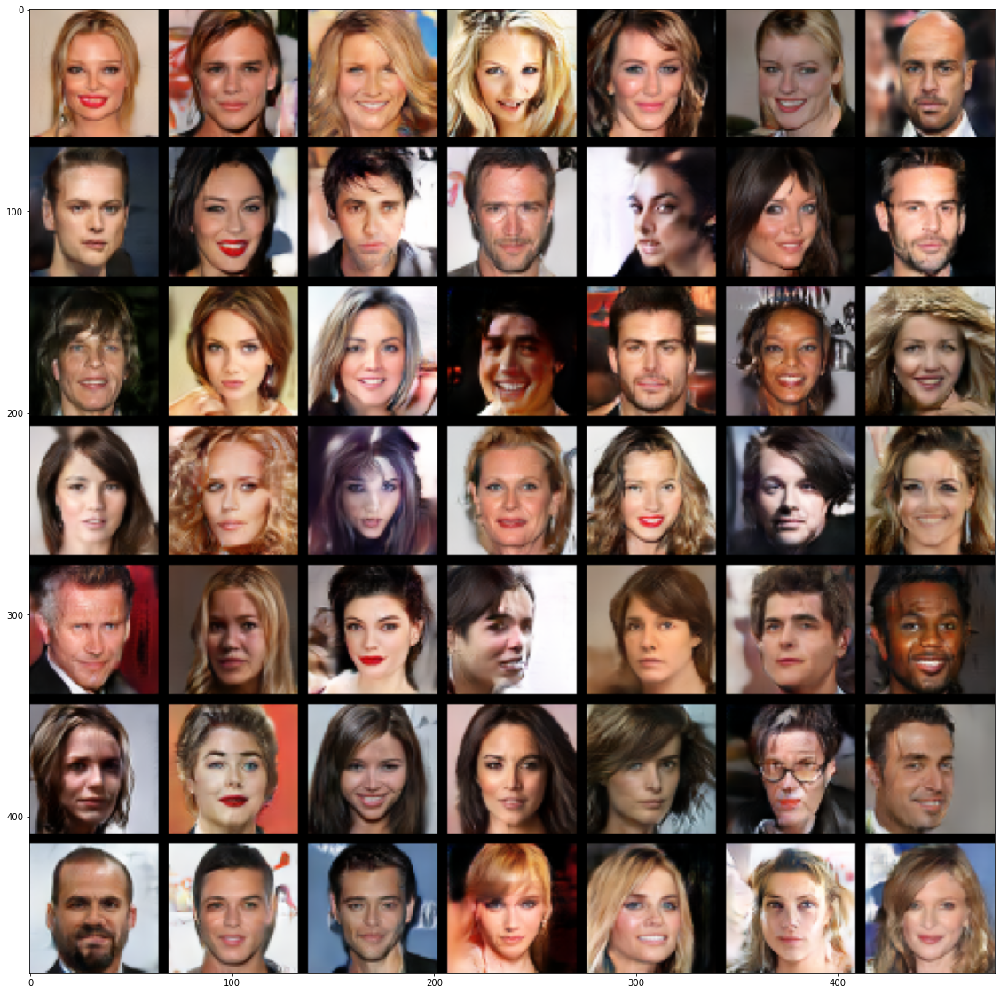

In [16]:
visualize_samples(biggan_64_512_2_sampler)

In [17]:
biggan_128_accu1_feats, _ = misc.project(biggan_128_accu1_sampler, proj_model, to_numpy=True)
biggan_128_accu2_feats, _ = misc.project(biggan_128_accu2_sampler, proj_model, to_numpy=True)

In [18]:
biggan_128_accu1_feats.shape, biggan_128_accu2_feats.shape

((10000, 2048), (10000, 2048))

In [19]:
biggan_64_256_1_feats, _ = misc.project(biggan_64_256_1_sampler, proj_model, to_numpy=True)
biggan_64_512_2_feats, _ = misc.project(biggan_64_512_2_sampler, proj_model, to_numpy=True)

In [20]:
for dset_name, src_feat in celebahq_128_feats.items():
    print(dset_name)
    
    src_mu = np.mean(src_feat, axis=0)
    src_cov = np.cov(src_feat, rowvar=False)
    
    fid = calculate_frechet_distance(np.mean(biggan_128_accu1_feats, axis=0),
                                     np.cov(biggan_128_accu1_feats, rowvar=False),
                                     src_mu, src_cov)
    print(f'FID accu1 = {fid}')
    
    fid = calculate_frechet_distance(np.mean(biggan_128_accu2_feats, axis=0),
                                     np.cov(biggan_128_accu2_feats, rowvar=False),
                                     src_mu, src_cov)
    print(f'FID accu2 = {fid}')

train
FID accu1 = 13.639674736804466
FID accu2 = 15.772943332658599
test
FID accu1 = 14.657280285676336
FID accu2 = 16.723120590929113


In [21]:
for dset_name, src_feat in celebahq_64_feats.items():
    print(dset_name)
    
    src_mu = np.mean(src_feat, axis=0)
    src_cov = np.cov(src_feat, rowvar=False)
    
    fid = calculate_frechet_distance(np.mean(biggan_64_256_1_feats, axis=0),
                                     np.cov(biggan_64_256_1_feats, rowvar=False),
                                     src_mu, src_cov)
    print(f'FID bsize256 = {fid}')
    
    fid = calculate_frechet_distance(np.mean(biggan_64_512_2_feats, axis=0),
                                     np.cov(biggan_64_512_2_feats, rowvar=False),
                                     src_mu, src_cov)
    print(f'FID bsize512 = {fid}')

train
FID bsize256 = 9.96686930807212
FID bsize512 = 8.548638617626523
test
FID bsize256 = 10.5885779135848
FID bsize512 = 9.036633128575005


In [ ]:
# issue: maybe have to consider faces are not objects